In [1]:
import tensorflow as tf
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import requests
import urllib.request
import PIL.Image as pilimg
from inception.data import build_image_data
from inception import image_processing
from inception import inception_model as inception
from os import listdir
from os.path import isfile, join
from sklearn.neighbors import NearestNeighbors
from bs4 import BeautifulSoup

# weight파일의 경로
checkpoint_dir = "D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\inception-v3"

# 이미지의 경로
my_image_path = "D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\images/"

# 11번가API를 사용하기 위함
key = "d38e157e0e550b05ad900b4a8e82067e"
apiCode = "ProductInfo" 

# infdata_list를 csv파일에서 읽어온다. 
infdata_list = pd.read_csv("./infdata_list.csv", header=None)

# img_file_list를 csv파일에서 읽어온다. 
img_file_list = pd.read_csv("img_file_list.csv", header=None)

# 이미지를 분석해 데이터를 만드는 함수를 정의한다. -> input 이미지를 분석할 때 필요
# 이미지가 하나일 경우
def inference_on_image(img_path):
  with tf.Graph().as_default():
    num_classes = 1001

    coder = build_image_data.ImageCoder()

    image_buffer, _, _ =  build_image_data._process_image(img_path, coder)

    image = image_processing.image_preprocessing(image_buffer, 0, False) # image -> (299, 299, 3)
    image = tf.expand_dims(image,0) # (299, 299,3) -> (1, 299, 299, 3)

    logits, _ = inception.inference(image, num_classes, for_training=False, restore_logits=True)

      
    saver = tf.train.Saver()
    with tf.Session() as tf_session:
      ckpt = tf.train.get_checkpoint_state(checkpoint_dir)
      if ckpt and ckpt.model_checkpoint_path:
        if os.path.isabs(ckpt.model_checkpoint_path):
          # Restores from checkpoint with absolute path.
          saver.restore(tf_session, ckpt.model_checkpoint_path)
          # saver.restore(tf_session, "/tmp/train_back/model.ckpt-640")
        else:
          # Restores from checkpoint with relative path.
          saver.restore(tf_session, os.path.join(FLAGS.checkpoint_dir,
                                           ckpt.model_checkpoint_path))
      l = tf_session.run([logits])
      return l

# 이미지를 출력하는 함수를 정의한다. 
def print_image(path):
    plt.figure()
    im = mpimg.imread(path)
    plt.imshow(im)
    plt.show()
    
def show_image(predictions):
    for i in predictions:
        print_image(my_image_path + img_file_list[0][i])

# 이미지 경로를 입력할 경우 해당 이미지와 비슷한 상품을 찾아주는 함수를 정의한다.        
def imageSearch(image_path_one):
    infdata_one = inference_on_image(image_path_one)
    predict_once = knn.kneighbors(infdata_one[0], return_distance=False)

    print("<<검색 이미지>>")
    print_image(image_path_one)

    print("<<검색 결과 상품>>")
    for i in range(20):
        productCode = img_file_list[0][predict_once[0][i]].split('.')[0]
        url = "http://openapi.11st.co.kr/openapi/OpenApiService.tmall?key="+key+"&apiCode="+apiCode+"&productCode="+productCode
        req = requests.get(url)
        xmlRowdata = req.content.decode('cp949')
        soup = BeautifulSoup(xmlRowdata, 'html.parser')
    
        print("이름: "+soup.find('productname').text+"   (상품 코드: "+soup.find('productcode').text+")")
        print("가격: "+soup.find('price').text+"   최저가: "+soup.find('lowestprice').text)
        print("배송비: "+soup.find('shipfee').text)
        print_image(my_image_path + img_file_list[0][predict_once[0][i]])
        
# nearest neighbor알고리즘을 통해 거리를 계산한다. 
knn = NearestNeighbors(n_neighbors=20) # 가까운 이웃 20개를 조사한다.
knn.fit(infdata_list)

NearestNeighbors(n_neighbors=20)

INFO:tensorflow:Restoring parameters from D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\inception-v3\model.ckpt-157585
<<검색 이미지>>


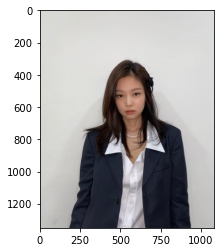

<<검색 결과 상품>>
이름: 싱글 린넨 자켓(PK2EJ461)/플라스틱아일랜드스토리   (상품 코드: 2831546251)
가격: 55,000원   최저가: 42,400원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


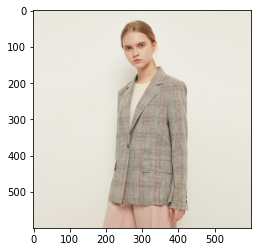

이름: MODERN WOOL HALF COAT (BLACK)/ 리우닉   (상품 코드: 1878212956)
가격: 166,600원   최저가: 166,600원
배송비: 무료


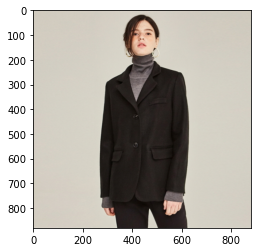

이름: [얀써틴][YAN13] CLASSY WOOL SINGLE JACKET_BROWN (3050941)   (상품 코드: 2877489652)
가격: 129,000원   최저가: 122,610원
배송비: 무료


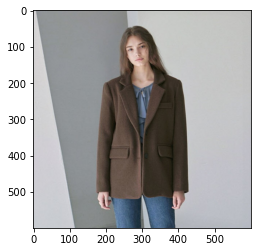

이름: [마담4060]엄마옷 마담4060 깔끔의정석자켓-QJK004016-   (상품 코드: 2821718937)
가격: 76,700원   최저가: 76,700원
배송비: 무료


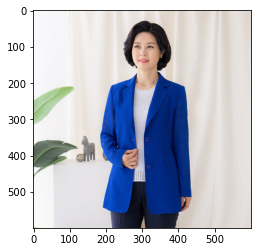

이름: [얀써틴][YAN13] WOOL ANGORA HALF COAT_BLACK (1964103)   (상품 코드: 2904289584)
가격: 218,000원   최저가: 218,000원
배송비: 1원 미만 구매 2,500원 / 1원 이상 구매 무료


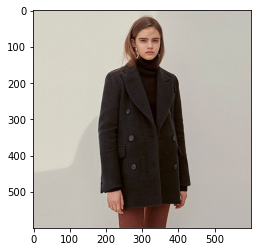

이름: [얀써틴][YAN13] MERIT SINGLE JACKET_BLACK (5105454)   (상품 코드: 2877539040)
가격: 103,350원   최저가: 98,230원
배송비: 무료


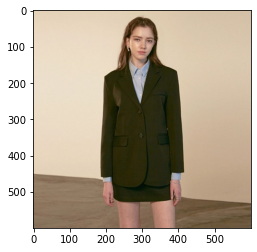

이름: [얀써틴][YAN13] WOOL ANGORA HALF COAT_BLACK (1964103)   (상품 코드: 2877439700)
가격: 218,000원   최저가: 207,190원
배송비: 무료


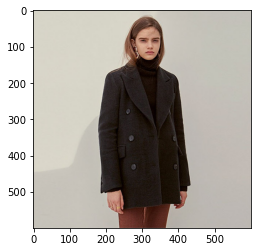

이름: [미테]OVER SIZE WIDE LAPEL PEA COAT   (상품 코드: 2652741738)
가격: 290,000원   최저가: 275,500원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


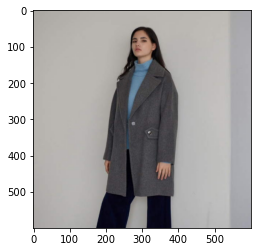

이름: [딘스(DEANS)][DEANS] CLASSIC SINGLE LINEN JACKET_LIGHT GREEN (5633877)   (상품 코드: 2897030232)
가격: 99,200원   최저가: 92,590원
배송비: 무료


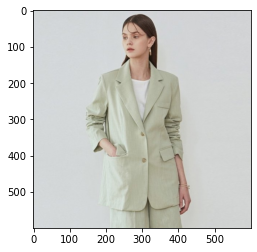

이름: [기존가 89000원]엣지 SUMMER20 [프렌치소재] 린넨100 자켓   (상품 코드: 2788130802)
가격: 59,000원   최저가: 56,050원
배송비: 무료


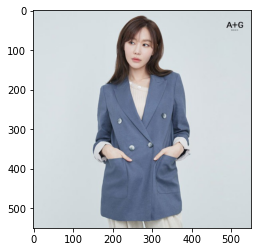

이름: [갤러리아] [20 S/S]캐쥬얼  린넨 혼방 자켓[EWJKKD05,EWJKKD0500]   (상품 코드: 2840384622)
가격: 149,000원   최저가: 126,650원
배송비: 3,000원@30,000원 미만 구매/무료@30,000원 이상 구매


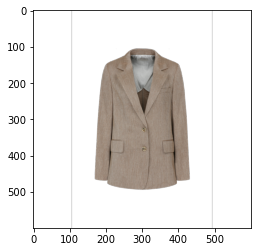

이름: 스몰 패턴 숏 자켓 MIWJKA352B   (상품 코드: 2777883992)
가격: 69,900원   최저가: 45,440원
배송비: 2,500원@30,000원 미만 구매/무료@30,000원 이상 구매


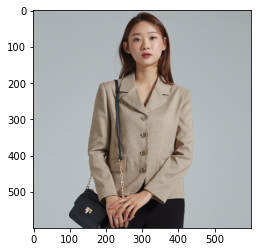

이름: [닉앤니콜][닉앤니콜] OVER LEATHER SINGLE JACKET_BLACK (5167749)   (상품 코드: 2767970357)
가격: 67,500원   최저가: 64,800원
배송비: 무료


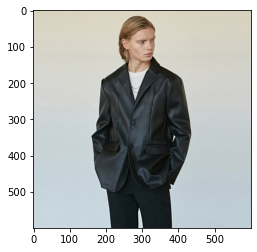

이름: [아미마켓][핀블랙] WOOL REVERSIBLE DUMBLE MUSTANG COAT GREEN   (상품 코드: 2776294083)
가격: 368,000원   최저가: 368,000원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


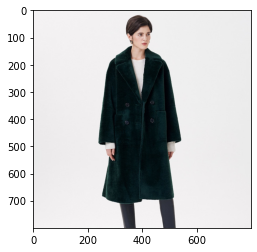

이름: [딘스(DEANS)][DEANS] SUMMER WRAP BOYFRIEND JACKET_NAVY (5633777)   (상품 코드: 2897029246)
가격: 105,600원   최저가: 98,560원
배송비: 무료


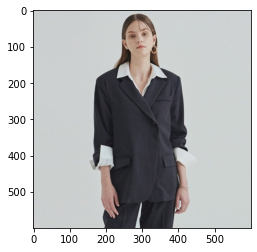

이름: 린넨 아웃포켓 자켓 (SW5JK82-OK)/숲   (상품 코드: 2865459472)
가격: 139,000원   최저가: 130,660원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


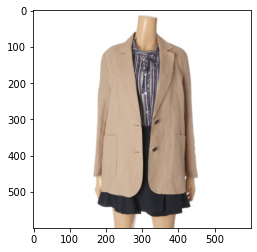

이름: TR 원버튼 테일러드 싱글 자켓 MIWJKA42PG   (상품 코드: 2797200098)
가격: 39,900원   최저가: 39,900원
배송비: 30,000원 미만 구매 2,500원 / 30,000원 이상 구매 무료


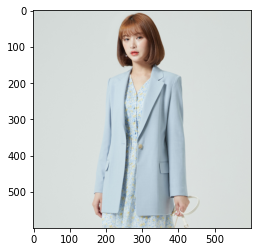

이름: [르피타]심플투버튼자켓 L202UJK452   (상품 코드: 2808123333)
가격: 92,500원   최저가: 92,500원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


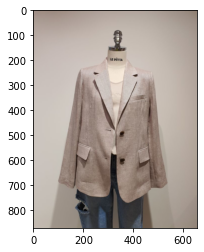

이름: Anti-wrinkle Loose Fit Jacket Khaki(BSJK320_01)/삼이공쇼룸   (상품 코드: 2831323556)
가격: 158,400원   최저가: 126,570원
배송비: 무료


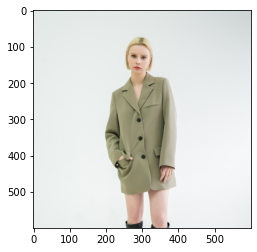

이름: 심플하면서  고급스러운  테일러드카라 자켓CL0MJK102/크로커다일 레이디   (상품 코드: 2872347738)
가격: 79,000원   최저가: 60,900원
배송비: 무료


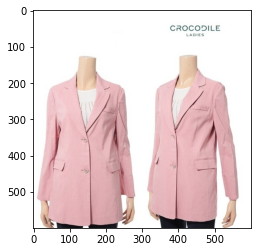

In [2]:
imageSearch("D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\input1.jpg")

INFO:tensorflow:Restoring parameters from D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\inception-v3\model.ckpt-157585
<<검색 이미지>>


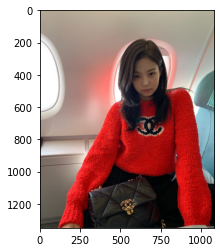

<<검색 결과 상품>>
이름: [옷자락]여자 펀칭 다이아 꽈배기 루즈핏 폴라 니트티셔츠   (상품 코드: 2726155739)
가격: 67,800원   최저가: 60,540원
배송비: 무료


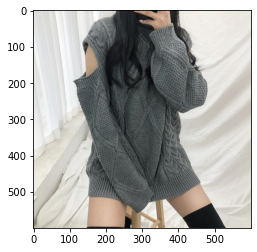

이름: [아미마켓][핀블랙] REVERSIBLE NOKARA SLIT MUSTANG COAT BEIGE   (상품 코드: 2776294137)
가격: 348,000원   최저가: 348,000원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


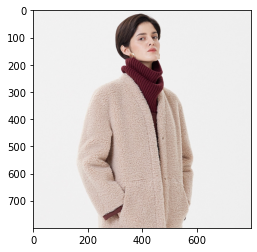

이름: 꽈배기 숏니트 써머가디건[AST3GY16G]/에이비에프지   (상품 코드: 2876440493)
가격: 34,000원   최저가: 26,210원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


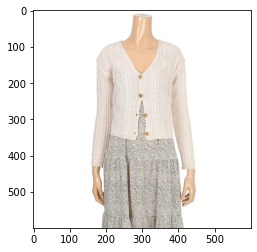

이름: JYD 2125 여자반폴라지퍼니트자켓가디건   (상품 코드: 2578239732)
가격: 31,300원   최저가: 31,300원
배송비: 무료


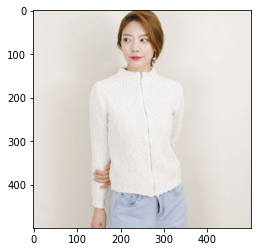

이름: [옷자락]여자 봄 가을 겨울 퍼프소매 골지 니트티셔츠   (상품 코드: 2818437761)
가격: 36,800원   최저가: 32,870원
배송비: 무료


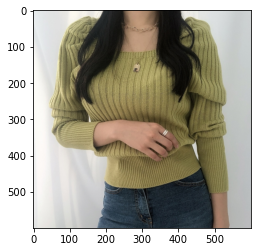

이름: [내추럴가든]꽃바구니 자수 레이스 린넨 블라우스   (상품 코드: 2821366357)
가격: 72,000원   최저가: 69,120원
배송비: 70,000원 미만 구매 3,500원 / 70,000원 이상 구매 무료


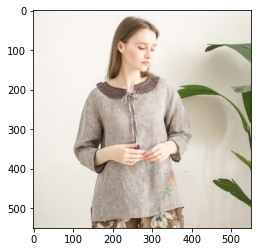

이름: [옷자락]여자 봄 여름 빈티지 유넥 시스루 테이핑 긴팔 니트 티셔츠   (상품 코드: 2880830045)
가격: 34,000원   최저가: 30,360원
배송비: 무료


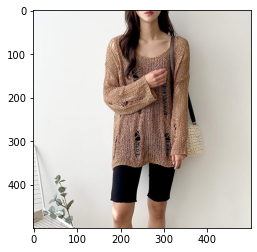

이름: [옷자락]여자 루즈핏 노카라 투포켓 롱 니트 가디건   (상품 코드: 2682225106)
가격: 45,800원   최저가: 40,900원
배송비: 무료


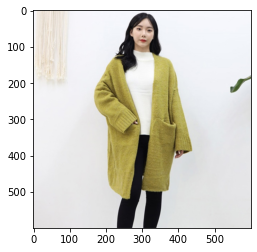

이름: [얀써틴][YAN13] NO COLLAR FUR HALF JACKET_BEIGE (3858848)   (상품 코드: 2877539289)
가격: 145,600원   최저가: 138,390원
배송비: 무료


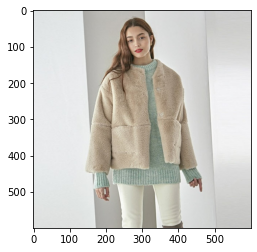

이름: [갤러리아] 린넨 체크 자켓(GKBIJK550)   (상품 코드: 2847053092)
가격: 78,000원   최저가: 59,280원
배송비: 3,000원@30,000원 미만 구매/무료@30,000원 이상 구매


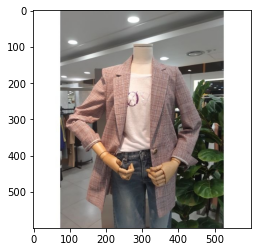

이름: [옷자락]여자 로즈 라운드 레이스 린넨 100 자켓   (상품 코드: 2899153480)
가격: 144,000원   최저가: 128,570원
배송비: 무료


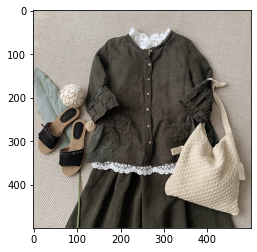

이름: [하프클럽/모슬린]엄마옷 모슬린 줄 하프 셔츠 남방 ENB004020 마담/미시옷/중년여성의류/빅사이즈   (상품 코드: 2823929723)
가격: 36,900원   최저가: 35,430원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


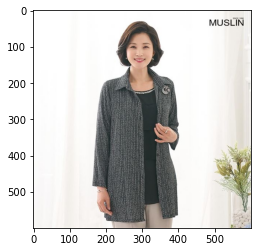

이름: [옷자락]여자 5컬러 기본핏 골지 니트 브이넥 가디건   (상품 코드: 2682371851)
가격: 30,000원   최저가: 26,790원
배송비: 무료


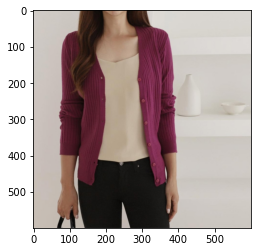

이름: [옷자락]여자 봄 부드러운 밤비 오버핏 꽈배기 라운드 니트 티셔츠   (상품 코드: 2739198159)
가격: 22,800원   최저가: 20,370원
배송비: 무료


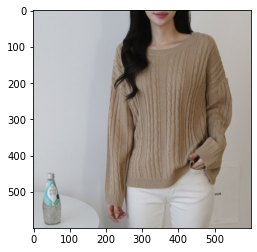

이름: [미쏘]엘라스틱조직감 스퀘어 블라우스 MIWBWA611C   (상품 코드: 2893320410)
가격: 39,900원   최저가: 39,900원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


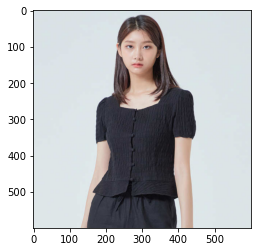

이름: V넥 캐시미어 니트 가디건 (ENCK93905Z)/이앤씨   (상품 코드: 2552695872)
가격: 25,000원   최저가: 19,270원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


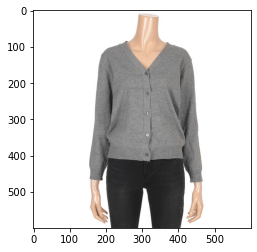

이름: [옷자락]여자 펀칭 커버업 니트 보트넥 긴팔 티셔츠   (상품 코드: 2849195357)
가격: 34,000원   최저가: 30,360원
배송비: 무료


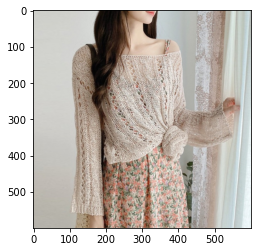

이름: 골드 버튼 시스루 니트 가디건 (ROCVCD060)/리안뉴욕   (상품 코드: 2800217056)
가격: 35,000원   최저가: 27,970원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


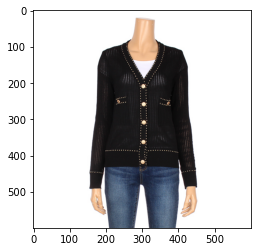

이름: [옷자락]여자 봄 신상 체리패턴 라운드넥 오버핏 니트 티셔츠   (상품 코드: 2777500474)
가격: 38,800원   최저가: 34,650원
배송비: 무료


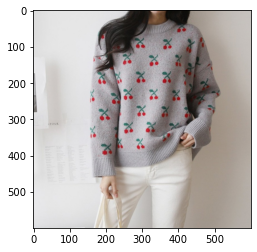

이름: [에고이스트]토스카나 퍼카라 숏 코트(EK4WC160)(강남점)   (상품 코드: 2678921410)
가격: 399,200원   최저가: 307,710원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


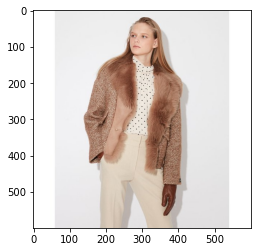

In [3]:
imageSearch("D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\input2.jpg")

INFO:tensorflow:Restoring parameters from D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\inception-v3\model.ckpt-157585
<<검색 이미지>>


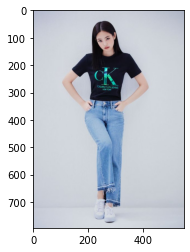

<<검색 결과 상품>>
이름: A+G 엣지 FALL19 라이크라 슬림 보이핏 데님 2종   (상품 코드: 2551080760)
가격: 59,000원   최저가: 56,050원
배송비: 무료


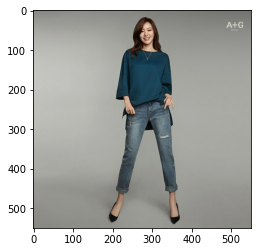

이름: 사이드 슬릿 컷오프 와이드 데님팬츠 TSMSLK60070/리스트   (상품 코드: 2868627485)
가격: 80,600원   최저가: 64,400원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


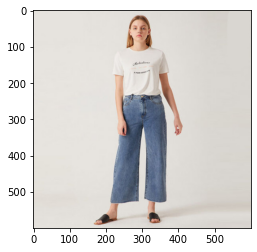

이름: [망고 (MANGO)] 돌먼 소매 블라우스   (상품 코드: 2790243957)
가격: 45,000원   최저가: 45,000원
배송비: 3,000원@50,000원 미만 구매/무료@50,000원 이상 구매


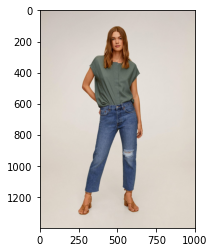

이름: 남성 테이퍼핏 데님(J312830)/캘빈클라인 진   (상품 코드: 2831056250)
가격: 67,230원   최저가: 48,670원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


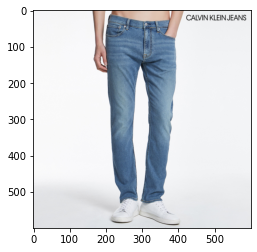

이름: 남녀공용 슬림 스판 청바지(NQG202)/뱅뱅   (상품 코드: 2831224418)
가격: 10,000원   최저가: 7,990원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


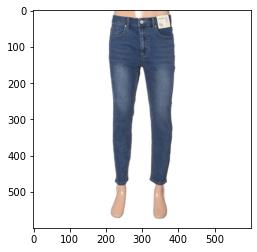

이름: [2001분당]뱅뱅 NC02 여성 부츠컷 스판청바지 NQG295   (상품 코드: 2786759642)
가격: 29,900원   최저가: 29,900원
배송비: 50,000원 미만 구매 3,000원 / 50,000원 이상 ~ 99,999,999원 미만 구매 무료


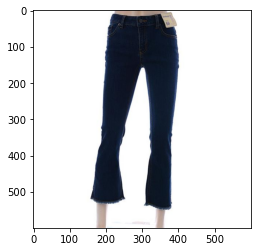

이름: 연청 세미 배기 바지 CY22DP020/레노마레이디스   (상품 코드: 2884192577)
가격: 55,000원   최저가: 43,950원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


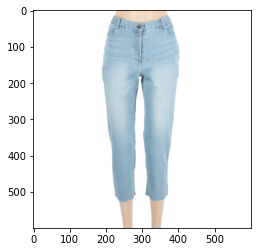

이름: 여성 9부 부츠컷 반하이 워싱 헤짐 밴딩 스판 청바지 여자 빅사이즈 팬츠 슬림 데님 바지/ 진마니아   (상품 코드: 2675450705)
가격: 17,900원   최저가: 17,900원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


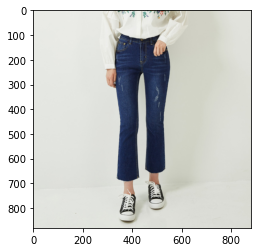

이름: [TBJ]여성 보이프렌드 데님 팬츠 (T185DP823M)   (상품 코드: 2752889499)
가격: 19,000원   최저가: 15,200원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


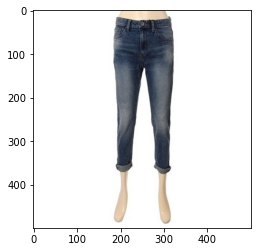

이름: [매그제이(MAGJAY)]린넨 벌룬 블라우스 (J202OBL140)   (상품 코드: 2907315610)
가격: 44,900원   최저가: 38,170원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


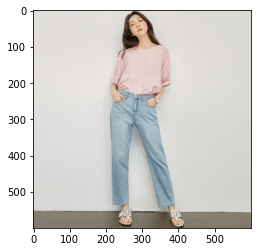

이름: [매그제이] Vol.2 세미부츠컷 (J201NPT212)   (상품 코드: 2772100176)
가격: 37,910원   최저가: 30,330원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


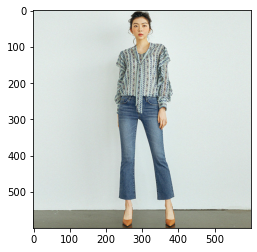

이름: [갤러리아] [20 여름]스트레이트 구제 데님팬츠(PL2DP482)   (상품 코드: 2819189903)
가격: 62,100원   최저가: 49,680원
배송비: 3,000원@30,000원 미만 구매/무료@30,000원 이상 구매


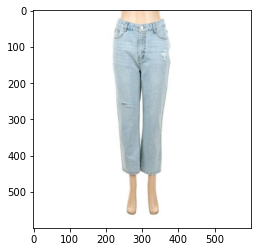

이름: 여성 L톤 밑단커팅 슬림붓컷(YJ2D7042)/게스(진)   (상품 코드: 2868371035)
가격: 55,200원   최저가: 41,520원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


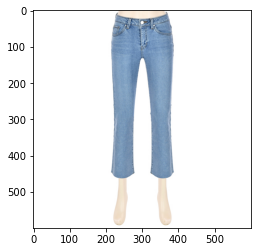

이름: [뱅뱅]여성부츠컷스판청바지(NQF295)   (상품 코드: 2314710576)
가격: 29,900원   최저가: 29,900원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


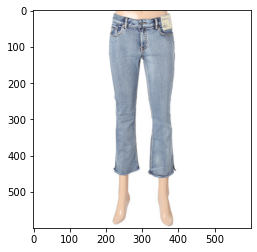

이름: [H스타일](GA)데일리일자팬츠.   (상품 코드: 2718627613)
가격: 12,900원   최저가: 11,770원
배송비: 무료


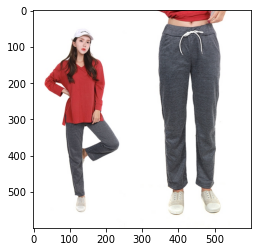

이름: [매그제이] 심플드롭반팔니트 (J202PNT122)   (상품 코드: 2837883557)
가격: 15,900원   최저가: 12,720원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


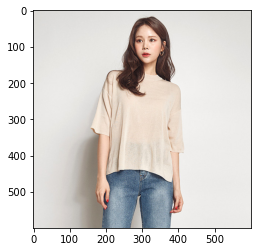

이름: [데일리스트서창] 밑단 트임 세미부츠컷 데님 팬츠_3MDEMPWM3321   (상품 코드: 2873181704)
가격: 82,000원   최저가: 70,520원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


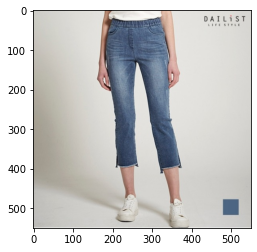

이름: 심플드롭반팔니트 (J202PNT122)/매그제이(MAGJAY)   (상품 코드: 2844496757)
가격: 15,900원   최저가: 13,160원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


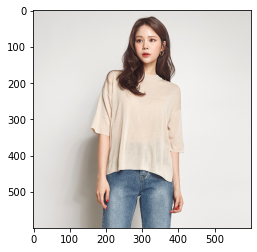

이름: 에잇세컨즈 블루 밑단 포인트 스트레이트 데님 팬츠 160221HP2P   (상품 코드: 2737357136)
가격: 29,900원   최저가: 28,710원
배송비: 39,900원 미만 구매 2,500원 / 39,900원 이상 구매 무료


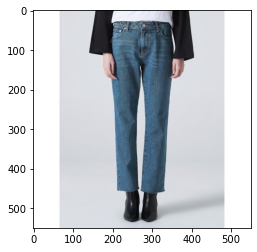

이름: [CK JEANS]20SS 제니 에디션 데님 여성 2종   (상품 코드: 2827801844)
가격: 159,000원   최저가: 151,050원
배송비: 무료


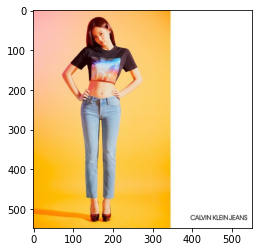

In [4]:
imageSearch("D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\input3.jpg")

INFO:tensorflow:Restoring parameters from D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\inception-v3\model.ckpt-157585
<<검색 이미지>>


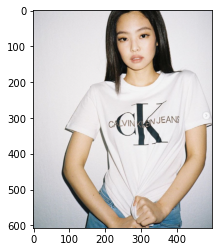

<<검색 결과 상품>>
이름: [트레져]트레져 Copyright 오버핏 반팔티셔츠   (상품 코드: 2858923250)
가격: 19,000원   최저가: 17,700원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


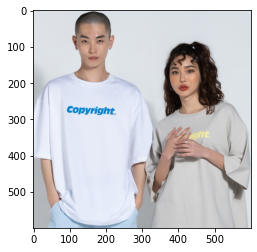

이름: [쉬즈미스][쉬즈미스] 19 여름신상 자수 레터링 블랜드 니트_SSKPOJ21050_IV   (상품 코드: 2411690073)
가격: 25,000원   최저가: 21,360원
배송비: 10,000원 미만 구매 2,500원 / 10,000원 이상 구매 무료


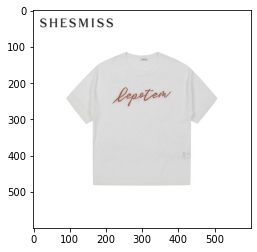

이름: [매그제이] 코튼 퍼프블라우스 (J202NBL469)   (상품 코드: 2881296758)
가격: 49,900원   최저가: 39,920원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


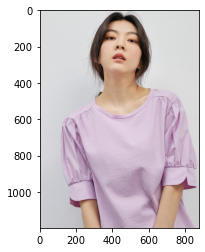

이름: [올리비아로렌] 리본소매배색블라우스_VOCNSUM4231   (상품 코드: 2796776923)
가격: 31,000원   최저가: 26,660원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


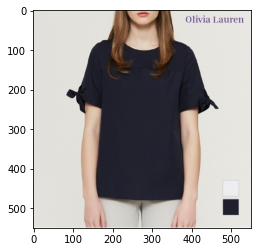

이름: 에잇세컨즈  화이트 배색 패턴 반소매 니트 320351LY91   (상품 코드: 2791780622)
가격: 35,900원   최저가: 34,470원
배송비: 39,900원 미만 구매 2,500원 / 39,900원 이상 구매 무료


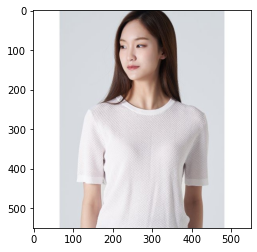

이름: [홈쇼핑인기]아라모드 린넨 카라 니트   (상품 코드: 2494180409)
가격: 7,900원   최저가: 7,900원
배송비: 30,000원 미만 구매 2,500원 / 30,000원 이상 구매 무료


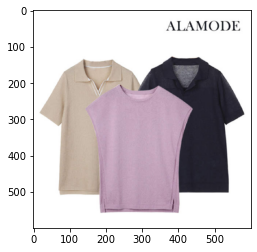

이름: [25%쿠폰] 어커버 1+1 린넨 팬츠 / 반팔티 / 체크팬츠 / 트랙팬츠   (상품 코드: 2317389321)
가격: 25,000원   최저가: 14,900원
배송비: 무료


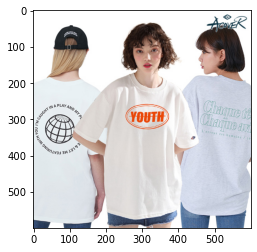

이름: [리스트]브이넥 리브드 반팔 니트_TSKPOJ62070_IV   (상품 코드: 2414802754)
가격: 35,000원   최저가: 29,750원
배송비: 2,500원@40,000원 미만 구매/무료@40,000원 이상 구매


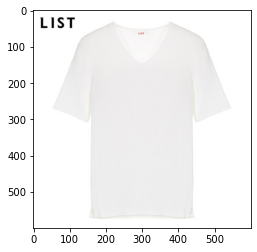

이름: [더틸버리] 프린팅 단가라 풀오버 니트 TK6M1PO52   (상품 코드: 2889668258)
가격: 55,200원   최저가: 47,700원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


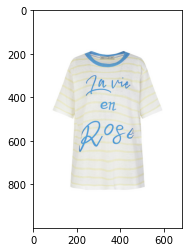

이름: 스트라이프 패턴 크루넥 니트(JC10250205)MI/쥬시 꾸뛰르   (상품 코드: 2831550682)
가격: 103,200원   최저가: 87,310원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


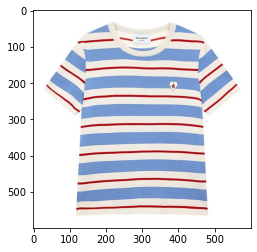

이름: [매그제이] 보트넥5부니트 (J202ANT117)   (상품 코드: 2865186831)
가격: 24,900원   최저가: 19,920원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


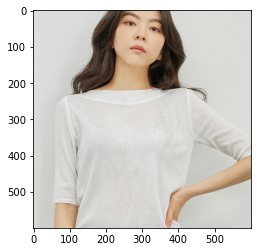

이름: 사이드 슬릿 루즈핏 블라우스(SWWBLK21060)/쉬즈미스   (상품 코드: 2887475495)
가격: 59,000원   최저가: 45,480원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


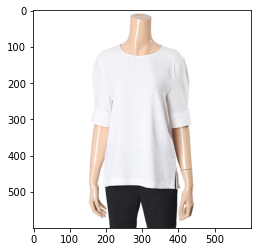

이름: [언더아머(UNDER ARMOUR)]남성 UA 스포츠스타일 로고 반팔 반바지 [1329590/1329300](본점)   (상품 코드: 2871489707)
가격: 35,000원   최저가: 29,610원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


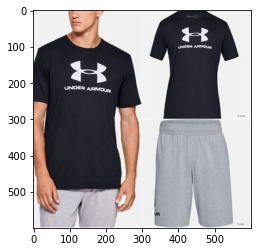

이름: [라푸마][19SS] [미라벨(Mirabelle)] 핑크 변형 헨리넥 반팔 티셔츠 LFTS9B321P1   (상품 코드: 2440267120)
가격: 24,500원   최저가: 20,830원
배송비: 30,000원 미만 구매 2,500원 / 30,000원 이상 구매 무료


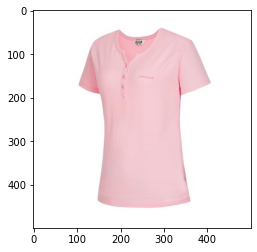

이름: [IMZ PREMIUM] S/S니트포켓 워싱 라운드티 65TS212 98   (상품 코드: 2342508282)
가격: 69,000원   최저가: 58,330원
배송비: 2,500원@30,000원 미만 구매/무료@30,000원 이상 구매


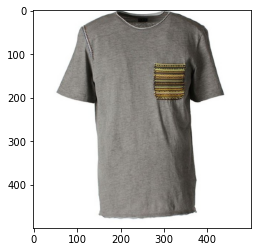

이름: BKMN509 스트라이프 니트/빅사이즈/미시/여성/봄   (상품 코드: 2882854531)
가격: 26,000원   최저가: 26,000원
배송비: 2,500원@70,000원 미만 구매/무료@70,000원 이상 구매


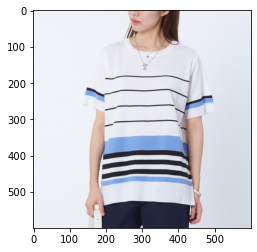

이름: [로앤디누아] 라운드넥 패턴 반팔 블라우스 57074_RY   (상품 코드: 2816958505)
가격: 9,900원   최저가: 9,310원
배송비: 무료


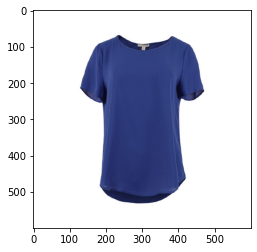

이름: [매그제이(MAGJAY)]보트넥5부니트 (J202ANT117)   (상품 코드: 2864997271)
가격: 24,900원   최저가: 21,170원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


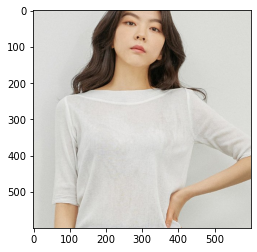

이름: 오버핏반소매원피스 AE2PA90/트리아나(여성)   (상품 코드: 2833245075)
가격: 74,000원   최저가: 57,040원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


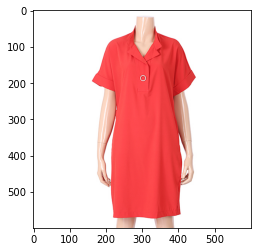

이름: 언더아머 UA 스위프트 반팔 티셔츠 1318421-001 여자반팔 인기반팔 운동복 스포츠웨어 추천   (상품 코드: 2811093489)
가격: 55,000원   최저가: 55,000원
배송비: 3,000원


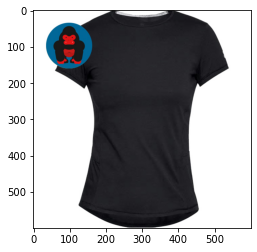

In [5]:
imageSearch("D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\input4.jpg")

INFO:tensorflow:Restoring parameters from D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\inception-v3\model.ckpt-157585
<<검색 이미지>>


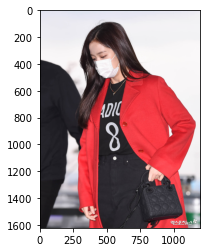

<<검색 결과 상품>>
이름: 노스페이스화이트라벨 여성용 뉴 타코마 짚 업BLK NJ5JJ33K (NJ5JJ33K)   (상품 코드: 2358032196)
가격: 64,000원   최저가: 57,200원
배송비: 3,000원(이 상품 70,000원 이상 주문 시 무료)


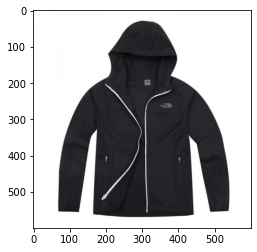

이름: 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반폴라 긴팔티 골지 맨투맨 45 R2 톰ST/ 쿨   (상품 코드: 2640785668)
가격: 21,800원   최저가: 20,500원
배송비: 무료


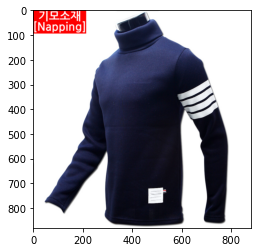

이름: 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반폴라 긴팔티 골지 맨투맨 45 R2 톰ST/ 쿨   (상품 코드: 2640785651)
가격: 21,800원   최저가: 20,500원
배송비: 무료


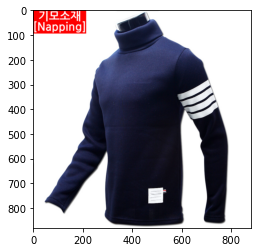

이름: 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반폴라 긴팔티 골지 맨투맨 45 R2 톰ST/ 쿨   (상품 코드: 2640785539)
가격: 21,800원   최저가: 20,500원
배송비: 무료


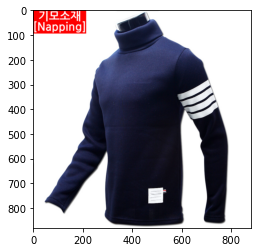

이름: [쿨제이] 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반   (상품 코드: 2640230823)
가격: 21,800원   최저가: 21,800원
배송비: 무료


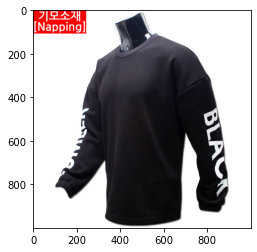

이름: [쿨제이] 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반   (상품 코드: 2640229969)
가격: 21,800원   최저가: 21,800원
배송비: 무료


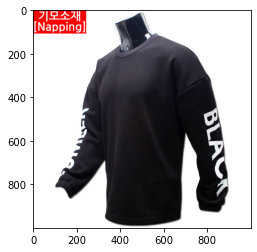

이름: [쿨제이] 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반   (상품 코드: 2640230984)
가격: 21,800원   최저가: 21,800원
배송비: 무료


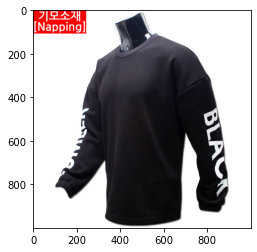

이름: [쿨제이] 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반   (상품 코드: 2640230637)
가격: 21,800원   최저가: 21,800원
배송비: 무료


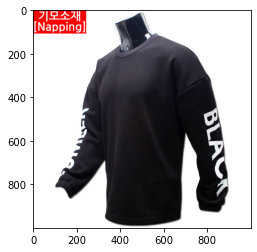

이름: [쿨제이] 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반   (상품 코드: 2640229986)
가격: 21,800원   최저가: 21,800원
배송비: 무료


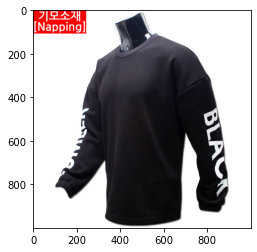

이름: [매장정품]시티 자켓 여성 집업 EA0422 블랙   (상품 코드: 2596958934)
가격: 79,000원   최저가: 79,000원
배송비: 무료


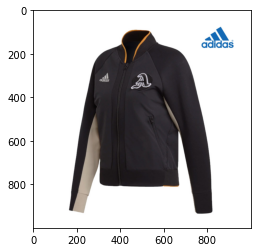

이름: 보리스자켓(FMJ192022-B)/후라밍고   (상품 코드: 2832159046)
가격: 71,200원   최저가: 56,890원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


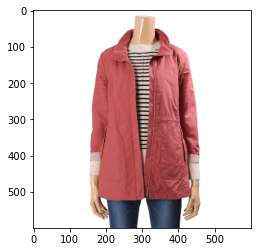

이름: 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반폴라 긴팔티 골지 맨투맨 37 R2 넘버블랙/   (상품 코드: 2642757670)
가격: 21,800원   최저가: 20,500원
배송비: 무료


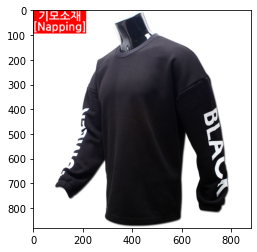

이름: 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반폴라 긴팔티 골지 맨투맨 37 R2 넘버블랙/   (상품 코드: 2642757596)
가격: 21,800원   최저가: 20,500원
배송비: 무료


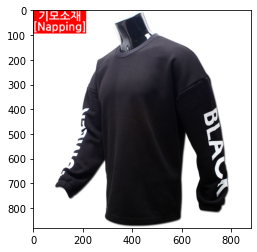

이름: 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반폴라 긴팔티 골지 맨투맨 37 R2 넘버블랙/   (상품 코드: 2642757691)
가격: 21,800원   최저가: 20,500원
배송비: 무료


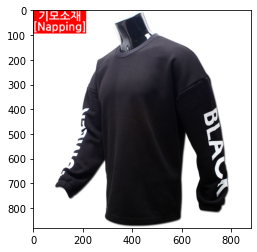

이름: 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반폴라 긴팔티 골지 맨투맨 32 R2 NB 레터링   (상품 코드: 2640785610)
가격: 21,800원   최저가: 20,500원
배송비: 무료


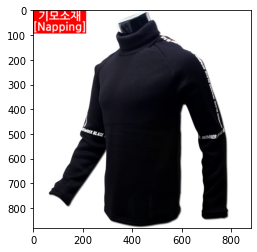

이름: 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반폴라 긴팔티 골지 맨투맨 32 R2 NB 레터링   (상품 코드: 2640785675)
가격: 21,800원   최저가: 20,500원
배송비: 무료


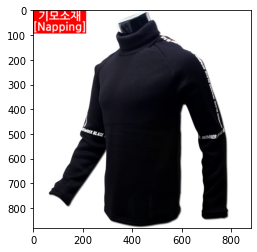

이름: 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반폴라 긴팔티 골지 맨투맨 32 R2 NB 레터링   (상품 코드: 2640785691)
가격: 21,800원   최저가: 20,500원
배송비: 무료


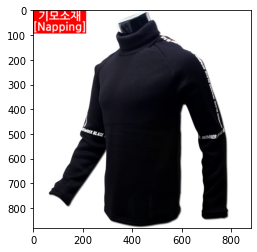

이름: [얀써틴][YAN13] MOOD ANORAK JACKET_BLACK (2116614)   (상품 코드: 2877437609)
가격: 87,000원   최저가: 82,690원
배송비: 무료


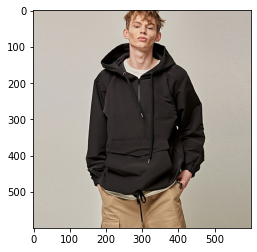

이름: [쿨제이] 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반   (상품 코드: 2640230882)
가격: 21,800원   최저가: 21,800원
배송비: 무료


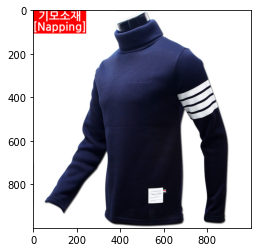

이름: [쿨제이] 남자 빅사이즈 여자 남녀공용 오버핏 후리스 기모 니트 폴라티 반   (상품 코드: 2640230585)
가격: 21,800원   최저가: 21,800원
배송비: 무료


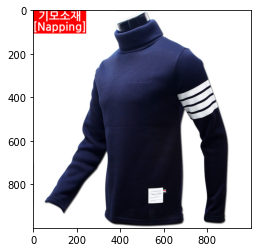

In [7]:
imageSearch("D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\input5.jpg")

INFO:tensorflow:Restoring parameters from D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\inception-v3\model.ckpt-157585
<<검색 이미지>>


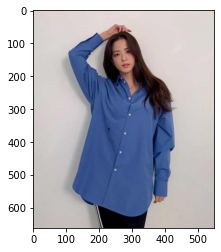

<<검색 결과 상품>>
이름: CASHMERE COAT(BLUISH GREEN)/트와(여성의류)   (상품 코드: 2830968014)
가격: 580,000원   최저가: 545,200원
배송비: 무료


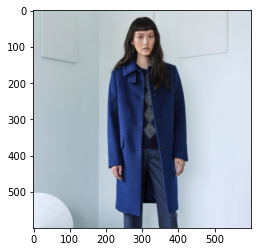

이름: [미쏘]투포켓 CN 자켓 MIWJJA433C   (상품 코드: 2823067442)
가격: 49,900원   최저가: 49,900원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


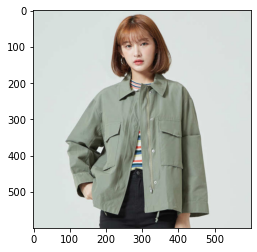

이름: 투포켓 CN 자켓 MIWJJA433C   (상품 코드: 2790963330)
가격: 49,900원   최저가: 49,900원
배송비: 30,000원 미만 구매 2,500원 / 30,000원 이상 구매 무료


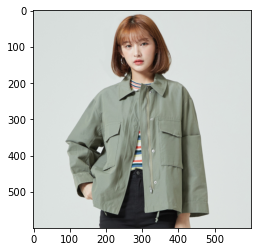

이름: [미테]OVER SIZE WIDE LAPEL PEA COAT   (상품 코드: 2652741139)
가격: 290,000원   최저가: 275,500원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


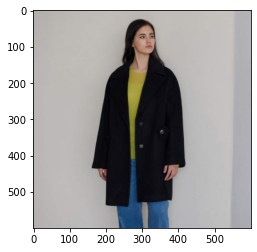

이름: [미테]MUFFLE LOOSE FIT HANDMADE COAT   (상품 코드: 2652739508)
가격: 390,000원   최저가: 370,500원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


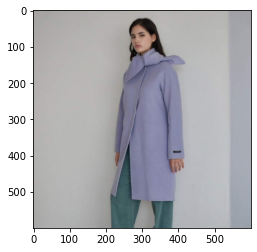

이름: [랩 LAP]반소매 크랍 자켓(AL2WJ640)/랩   (상품 코드: 2881050111)
가격: 71,200원   최저가: 58,910원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


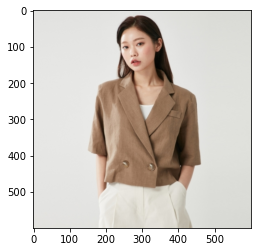

이름: 로렌비달 20SS 썸머 아사 면100  블라우스 3종   (상품 코드: 2895168138)
가격: 59,900원   최저가: 56,910원
배송비: 무료


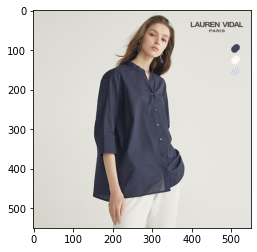

이름: [라인어디션]플랩 카라 버튼 블라우스(NWBLKD01)(강남점)   (상품 코드: 2876430658)
가격: 81,000원   최저가: 61,680원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


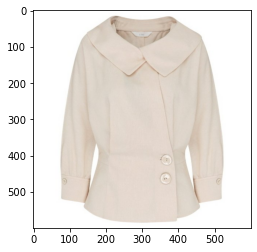

이름: EnC 린넨 반팔 원 버튼 랩 자켓 (ENJK02505Z)/이앤씨   (상품 코드: 2856285615)
가격: 58,000원   최저가: 46,350원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


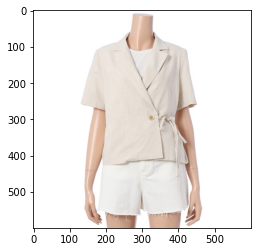

이름: [얀써틴][YAN13] OVERSIZE TRENDY JACKET_BLACK (1951134)   (상품 코드: 2877441031)
가격: 148,000원   최저가: 140,660원
배송비: 무료


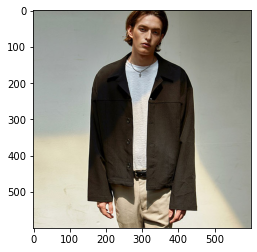

이름: [에잇세컨즈] 네이비 빅 버튼 루즈핏 재킷 (110439AYAR)   (상품 코드: 2818336872)
가격: 39,900원   최저가: 37,110원
배송비: 39,900원 미만 구매 2,500원 / 39,900원 이상 구매 무료


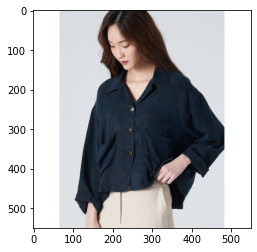

이름: [갤러리아] 반팔 데일리 자켓,CFB-JK208W5   (상품 코드: 2862403815)
가격: 59,000원   최저가: 49,560원
배송비: 3,000원@30,000원 미만 구매/무료@30,000원 이상 구매


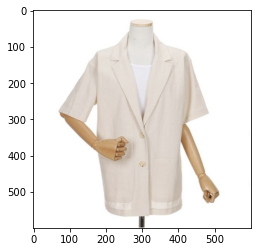

이름: [갤러리아] 반팔 데일리 자켓,CFB-JK208W5   (상품 코드: 2862402457)
가격: 59,000원   최저가: 49,560원
배송비: 3,000원@30,000원 미만 구매/무료@30,000원 이상 구매


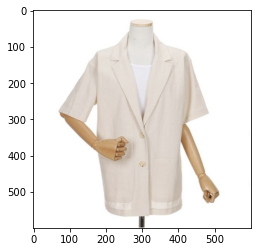

이름: [올리비아로렌]더블여밈 체크 자켓_VOCFUUM3351   (상품 코드: 2754989709)
가격: 87,000원   최저가: 74,820원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


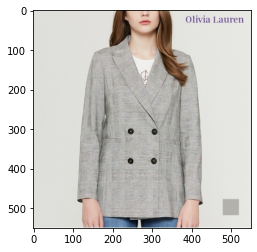

이름: [2만원인하]엣지 SUMMER20 린넨블렌디드 썸머 케이프 자켓   (상품 코드: 2833753841)
가격: 59,000원   최저가: 56,050원
배송비: 무료


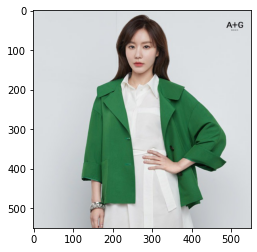

이름: [더애쉴린] ALEXA TWO-TONED COAT JACKET_PURPLE/더애쉴린   (상품 코드: 2831869512)
가격: 478,000원   최저가: 449,320원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


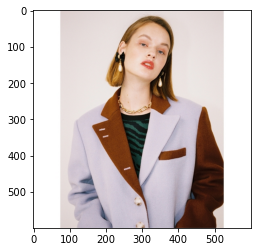

이름: 비지트뉴욕 카라넥 투버튼 포켓 린넨자켓 (V0AJKD06)/비지트인뉴욕   (상품 코드: 2809626083)
가격: 39,000원   최저가: 31,170원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


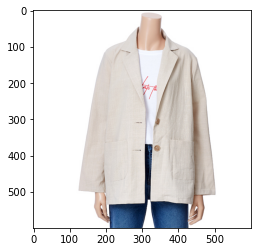

이름: [갤러리아] [19 겨울] 캐시미어 핸드메이드 코트 GJDBCT996F   (상품 코드: 2762041419)
가격: 89,000원   최저가: 67,640원
배송비: 3,000원@30,000원 미만 구매/무료@30,000원 이상 구매


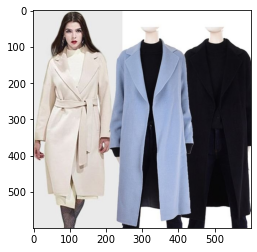

이름: [제이비리파인] SINGLE BUTTON RELAXED FIT ALPACA COAT (1984694)   (상품 코드: 2891287732)
가격: 264,120원   최저가: 264,120원
배송비: 80,000원 미만 구매 3,000원 / 80,000원 이상 구매 무료


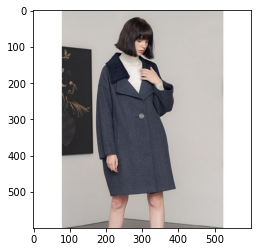

이름: [미테]OVER FIT BELTED HANDMADE HALF COAT   (상품 코드: 2652741765)
가격: 390,000원   최저가: 370,500원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


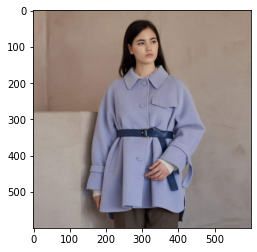

In [8]:
imageSearch("D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\input7.jpg")

INFO:tensorflow:Restoring parameters from D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\inception-v3\model.ckpt-157585
<<검색 이미지>>


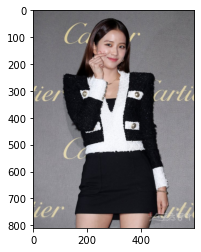

<<검색 결과 상품>>
이름: [아라모드] [홈쇼핑인기] 샤인 가디건 니트 앙상블   (상품 코드: 2395740108)
가격: 9,900원   최저가: 9,900원
배송비: 30,000원 미만 구매 2,500원 / 30,000원 이상 구매 무료


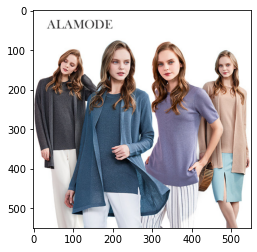

이름: W몰 올앤썬드리 A티라나COAT A8WAH871/ 올앤썬드리   (상품 코드: 2281806578)
가격: 199,000원   최저가: 199,000원
배송비: 70,000원 미만 구매 3,000원 / 70,000원 이상 구매 무료


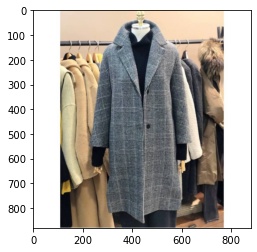

이름: [조셉안][조셉안]  BEIGE SINGLE TAILORED LACE COAT (1994526)   (상품 코드: 2256014707)
가격: 413,000원   최저가: 376,660원
배송비: 무료


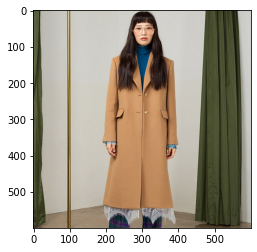

이름: [제이비리파인] PRINTS ON COLLAR STRIPE COAT (1984686)   (상품 코드: 2891232252)
가격: 358,980원   최저가: 358,980원
배송비: 80,000원 미만 구매 3,000원 / 80,000원 이상 구매 무료


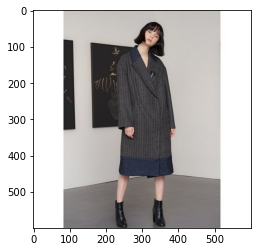

이름: [랩(LAP)]퍼프 프릴 블라우스 (AL2WB441)(경기점)   (상품 코드: 2823366983)
가격: 49,000원   최저가: 43,760원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


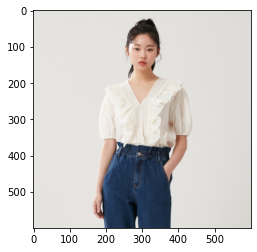

이름: 브이넥 슬림핏 싱글자켓 MIWJKA534B   (상품 코드: 2822959952)
가격: 49,900원   최저가: 39,920원
배송비: 2,500원@30,000원 미만 구매/무료@30,000원 이상 구매


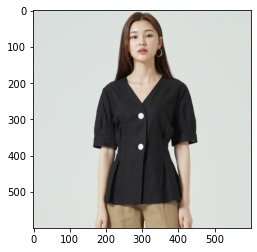

이름: [리스트]리스트 [인기]린넨 잔패턴 재킷 TWWJKJ60090   (상품 코드: 2509212341)
가격: 99,000원   최저가: 76,040원
배송비: 35,000원 미만 구매 3,000원 / 35,000원 이상 구매 무료


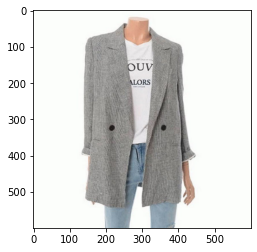

이름: [옷자락]여자 데일리 터틀넥 루즈 맨투맨 니트티셔츠   (상품 코드: 2682225789)
가격: 15,000원   최저가: 13,400원
배송비: 무료


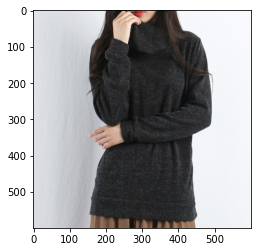

이름: [무니드][무니드] 블랙싱글자켓BLACK SINGLE JACKET (1962625)   (상품 코드: 2773255372)
가격: 198,000원   최저가: 180,580원
배송비: 무료


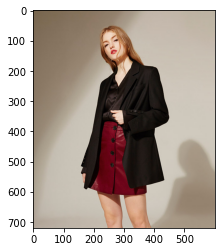

이름: [미테]CASH DOUBLE BELTED HANDMADE COAT   (상품 코드: 2652738593)
가격: 410,000원   최저가: 389,500원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


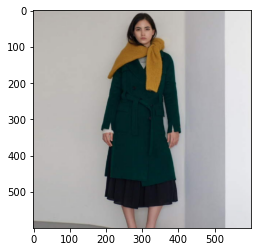

이름: [프릭스][FREAKS BY KIMTAEHOON] Classical Peaked-up Lapel Double Breasted Wool COAT_GREEN-CHECK (3575   (상품 코드: 2629007425)
가격: 403,200원   최저가: 367,720원
배송비: 무료


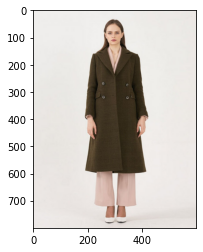

이름: V넥 노여밈 일자핏 자켓 MIWJKA710B   (상품 코드: 2887636721)
가격: 39,900원   최저가: 33,920원
배송비: 2,500원@30,000원 미만 구매/무료@30,000원 이상 구매


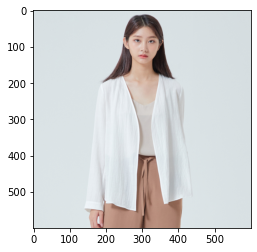

이름: [랭앤루(여성의류)] [랭앤루] 20S LUCIS COAT (루시스)_01 (LA006600107)   (상품 코드: 2767817187)
가격: 369,000원   최저가: 332,100원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


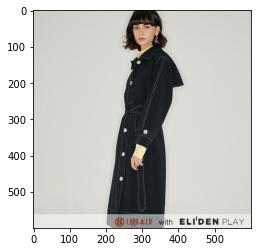

이름: [엘리든 플레이] [랭앤루] 20S LUCIS COAT (루시스)_01 (LA006600107)   (상품 코드: 2861277432)
가격: 369,000원   최저가: 369,000원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


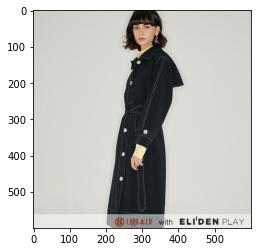

이름: [옷자락]여자 가을 민소매 반목 골지 니트티셔츠   (상품 코드: 2682225439)
가격: 19,000원   최저가: 16,970원
배송비: 무료


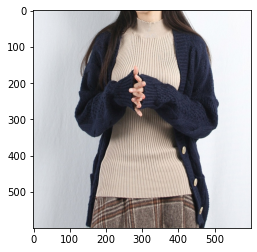

이름: [스토레츠]  Lyla Structured Satin Jacket 새틴 재킷   (상품 코드: 2807538949)
가격: 76,000원   최저가: 76,000원
배송비: 무료


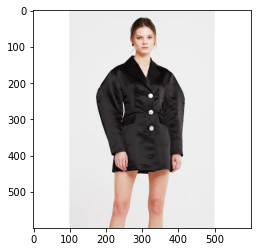

이름: [갤러리아] (인하)[20 SS]이지핏 체크자켓EWJKKD0600,EWJKKD06]   (상품 코드: 2897033682)
가격: 124,000원   최저가: 105,400원
배송비: 3,000원@30,000원 미만 구매/무료@30,000원 이상 구매


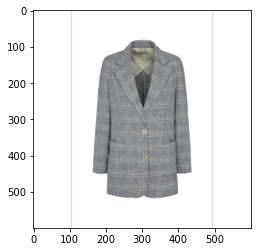

이름: [올리비아로렌] 린넨 스트라이프 테일러드 자켓_2VOPFUTM3361   (상품 코드: 2862349821)
가격: 48,000원   최저가: 41,280원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


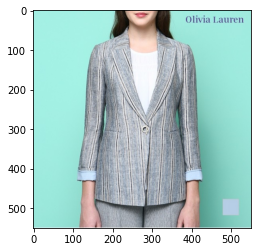

이름: [머스트비 外] Y 인기 니트/블라우스/코트/팬츠 3,900원~9,990원!   (상품 코드: 2668309781)
가격: 6,900원   최저가: 6,630원
배송비: 무료


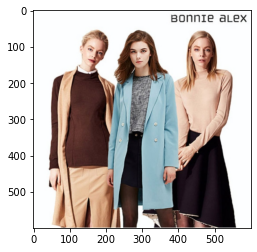

이름: [미테]OVER SIZE WIDE LAPEL PEA COAT   (상품 코드: 2652741139)
가격: 290,000원   최저가: 275,500원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


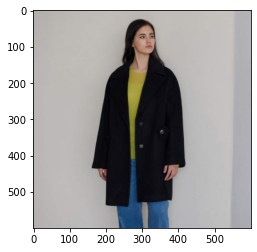

In [9]:
imageSearch("D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\input8.jpg")

INFO:tensorflow:Restoring parameters from D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\inception-v3\model.ckpt-157585
<<검색 이미지>>


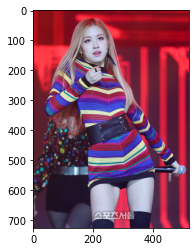

<<검색 결과 상품>>
이름: [모코블링] 컬러피온 - knt [니트/여자니트/반팔니트]   (상품 코드: 2782705834)
가격: 18,000원   최저가: 16,400원
배송비: 70,000원 미만 구매 2,500원 / 70,000원 이상 구매 무료


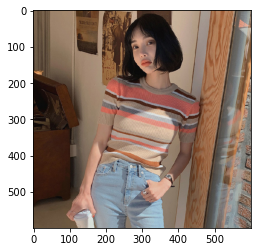

이름: 컬러피온 - knt [니트/여자니트/반팔니트]/ 모코블링   (상품 코드: 2785845957)
가격: 18,000원   최저가: 18,000원
배송비: 70,000원 미만 구매 2,500원 / 70,000원 이상 구매 무료


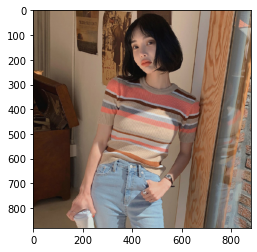

이름: [옷자락]여자 펀칭 커버업 니트 보트넥 긴팔 티셔츠   (상품 코드: 2849195357)
가격: 34,000원   최저가: 30,360원
배송비: 무료


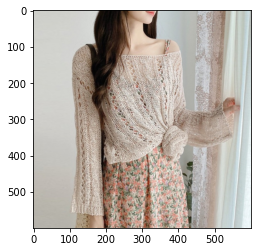

이름: [에고이스트] W몰 스트라이프 V넥 니트 EL1KL667   (상품 코드: 2696463175)
가격: 124,600원   최저가: 116,040원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


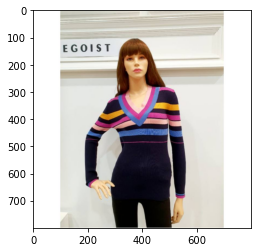

이름: [마담4060]엄마옷 마담4060 소녀플라워블라우스-QBL004059-   (상품 코드: 2832778233)
가격: 34,700원   최저가: 34,700원
배송비: 30,000원 미만 구매 2,500원 / 30,000원 이상 구매 무료


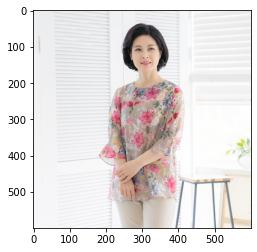

이름: [갤러리아] 컬러배색 V넥 반팔니트(GKB6KP740F)   (상품 코드: 2863872863)
가격: 53,000원   최저가: 40,280원
배송비: 3,000원@30,000원 미만 구매/무료@30,000원 이상 구매


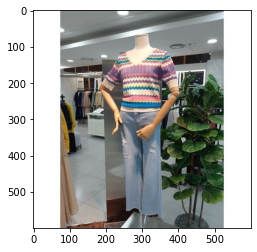

이름: [바이어스][바이어스] 여자 브이넥 고급스러운 루즈핏 꽈배기니트 유니크한 겨울 데일리룩 니트티셔츠 여성   (상품 코드: 2813316619)
가격: 31,000원   최저가: 29,470원
배송비: 무료


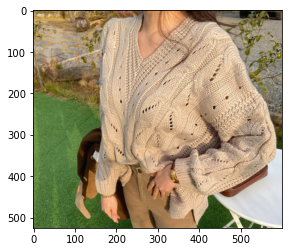

이름: 청량감이 좋은 에스닉 스타일의 인견 블라우스CL0MBL505/크로커다일 레이디   (상품 코드: 2881001251)
가격: 71,000원   최저가: 54,730원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


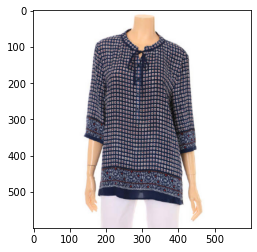

이름: 볼륨 소매 BL (EL2WB368)+장식고리/에고이스트   (상품 코드: 2883098750)
가격: 89,000원   최저가: 66,930원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


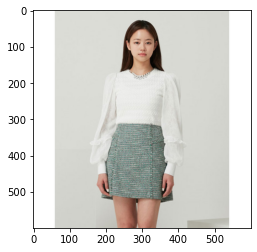

이름: 볼륨 소매 BL (EL2WB368)+장식고리/에고이스트   (상품 코드: 2881159106)
가격: 89,000원   최저가: 68,610원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


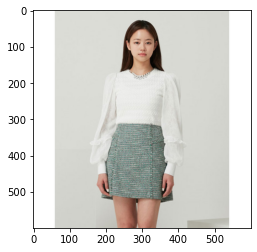

이름: [옷자락]여자 펀칭 다이아 꽈배기 루즈핏 폴라 니트티셔츠   (상품 코드: 2726155739)
가격: 67,800원   최저가: 60,540원
배송비: 무료


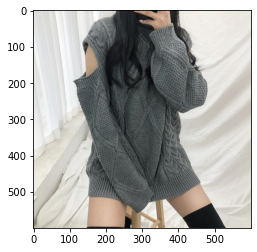

이름: [올리비아로렌] 스트라이프 A라인 브이넥 니트_2VOIBLTM3182   (상품 코드: 2835763924)
가격: 41,000원   최저가: 35,260원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


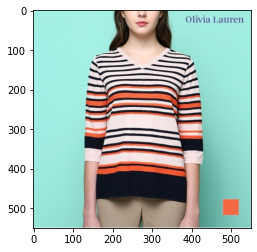

이름: [옷자락]여자 데일리 아이보리 오버핏 숄 니트가디건   (상품 코드: 2682312465)
가격: 22,000원   최저가: 19,650원
배송비: 무료


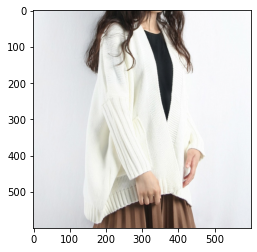

이름: 쥬크 잔체크 넥프릴 린넨 블라우스/ 내추럴가든   (상품 코드: 2845486286)
가격: 49,750원   최저가: 40,800원
배송비: 70,000원 미만 구매 3,500원 / 70,000원 이상 구매 무료


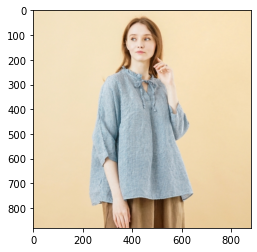

이름: [옷자락]여자 가을 민소매 반목 골지 니트티셔츠   (상품 코드: 2682225439)
가격: 19,000원   최저가: 16,970원
배송비: 무료


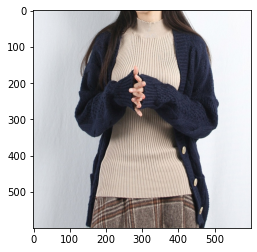

이름: [탑텐] 여성 폰테 페플럼 미니스커트   (상품 코드: 2712629301)
가격: 6,600원   최저가: 6,600원
배송비: 9,800원 미만 구매 2,500원 / 9,800원 이상 구매 무료


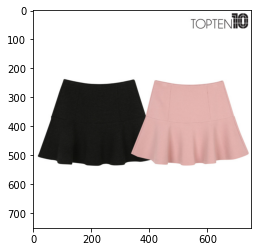

이름: [파인드미][파인드미 - Findme]peanut check skirt   (상품 코드: 2658375949)
가격: 36,250원   최저가: 33,770원
배송비: 70,000원 미만 구매 2,500원 / 70,000원 이상 구매 무료


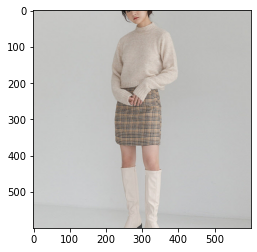

이름: 에잇세컨즈 아이보리 리본 블라우스 110565AYC0   (상품 코드: 2864934108)
가격: 27,900원   최저가: 26,790원
배송비: 39,900원 미만 구매 2,500원 / 39,900원 이상 구매 무료


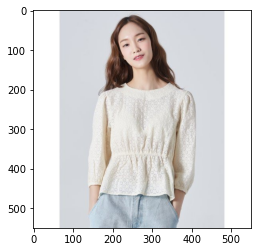

이름: [바이어스][바이어스] 램스 울 루즈핏 브이넥조끼 여자 하프 니트조끼 원피스 롱 베스트 (4323365)]   (상품 코드: 2813284416)
가격: 29,000원   최저가: 27,570원
배송비: 무료


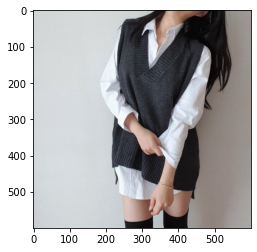

이름: 에잇세컨즈  카키 리브 크롭 썸머 니트 350451LBAH   (상품 코드: 2813969755)
가격: 19,900원   최저가: 19,110원
배송비: 39,900원 미만 구매 2,500원 / 39,900원 이상 구매 무료


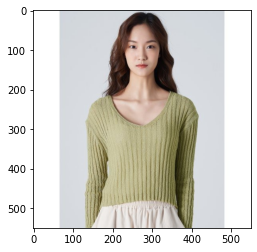

In [10]:
imageSearch("D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\input9.jpg")

INFO:tensorflow:Restoring parameters from D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\inception-v3\model.ckpt-157585
<<검색 이미지>>


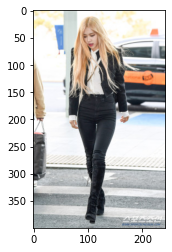

<<검색 결과 상품>>
이름: [모다아울렛][에고이스트]배색캡소매니트(EK2KH464)   (상품 코드: 2813316003)
가격: 53,400원   최저가: 50,730원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


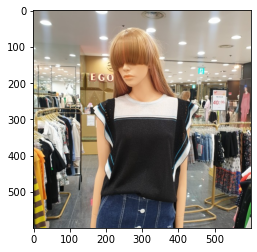

이름: 플라스틱아일랜드 V넥 물결 펀칭 반팔 블라우스 (PLEWB097-1)/플라스틱아일랜   (상품 코드: 2844421668)
가격: 27,000원   최저가: 25,380원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


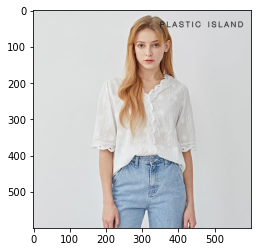

이름: B패치 세미 트레이닝팬츠 JE-2560 트레이닝바지 츄리닝바지 트레이닝복 트레이닝팬츠 요가바지   (상품 코드: 2620486392)
가격: 13,430원   최저가: 13,030원
배송비: 무료


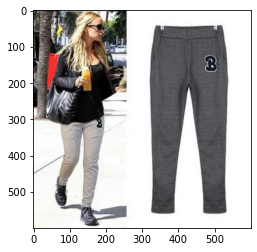

이름: 페미닌 슬릿 블라우스 SAWS36931/시슬리   (상품 코드: 2828308060)
가격: 119,000원   최저가: 89,490원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


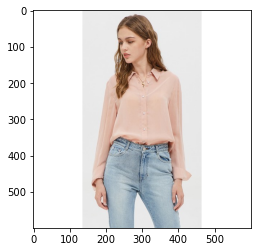

이름: [로로텐][로로텐]마네 린넨 반팔자켓   (상품 코드: 2872738918)
가격: 47,300원   최저가: 44,060원
배송비: 80,000원 미만 구매 2,500원 / 80,000원 이상 구매 무료


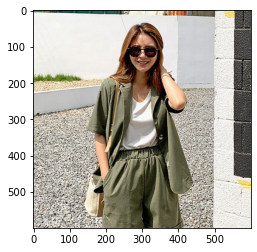

이름: [랩 LAP]체크쉬폰 롱 블라우스(AL2WB466)/랩   (상품 코드: 2839461311)
가격: 53,100원   최저가: 43,930원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


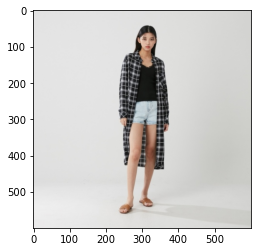

이름: [랩(LAP)]메탈 스트라이프 니트 (AL2KH463)(김해점)   (상품 코드: 2828187160)
가격: 59,000원   최저가: 47,150원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


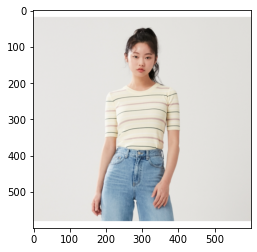

이름: [잠뱅이][jambangee] 여성 쿨맥스 밑단컷팅 바이오스톤 올브러쉬 구제 워싱 7부 롤업 데님 AJ2DL782-MB   (상품 코드: 2443186144)
가격: 25,900원   최저가: 23,880원
배송비: 무료


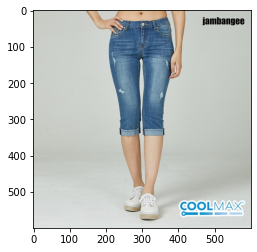

이름: [르샵] 슬릿 부츠컷 데님팬츠 LK4DP202A   (상품 코드: 2844137059)
가격: 59,000원   최저가: 43,070원
배송비: 3,000원@30,000원 미만 구매/무료@30,000원 이상 구매


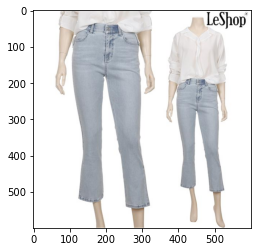

이름: [랩(LAP)]퍼프 프릴 블라우스 (AL2WB441)(경기점)   (상품 코드: 2823366983)
가격: 49,000원   최저가: 43,760원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


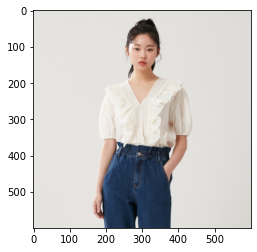

이름: [시흥점][에고이스트]플리츠 미니 스커트 (EL1WS763)   (상품 코드: 2752013039)
가격: 138,600원   최저가: 138,600원
배송비: 1,800원


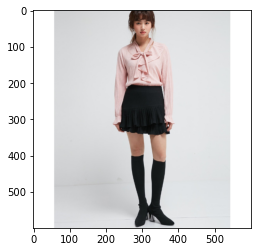

이름: 뱅뱅 여름 여성 라이크라 스판 청바지 (MQF177)/에이니   (상품 코드: 2459462929)
가격: 19,900원   최저가: 18,710원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


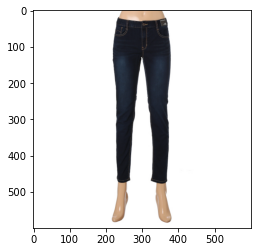

이름: [아르댓] [SSG 특별혜택] Slit Flare Skirt Beige   (상품 코드: 2412584322)
가격: 60,900원   최저가: 51,770원
배송비: 무료


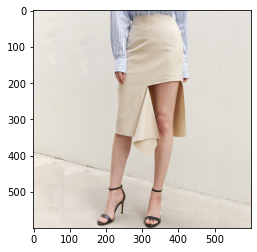

이름: [여성]맥스튜어트 오르타 프리미엄 데님 3종   (상품 코드: 2814869205)
가격: 39,900원   최저가: 34,600원
배송비: 무료


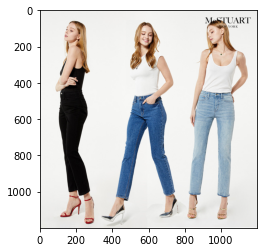

이름: [TBJ]여성 보이프렌드 데님 팬츠 (T185DP823M)   (상품 코드: 2752889499)
가격: 19,000원   최저가: 15,200원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


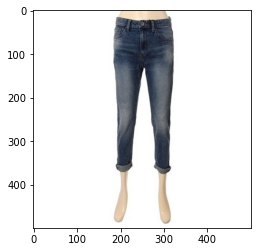

이름: [잠뱅이]남성 쿨맥스 엠보 페인트 워싱 스키니 데님 AI2DSN32-MB   (상품 코드: 2734558677)
가격: 16,900원   최저가: 15,590원
배송비: 무료


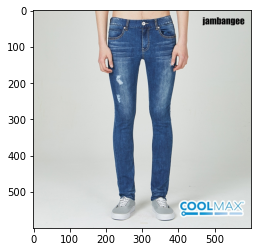

이름: [H스타일](BS)PINK배색요가6부SL   (상품 코드: 2708081742)
가격: 22,900원   최저가: 20,890원
배송비: 무료


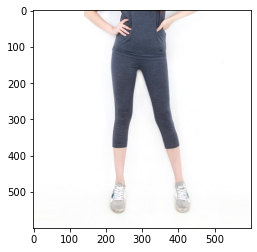

이름: 남성 원워시 커플 슬림 스트레이트 MK1D2060/게스(진)   (상품 코드: 2883000002)
가격: 142,800원   최저가: 114,100원
배송비: 30,000원 미만 구매 3,000원 / 30,000원 이상 구매 무료


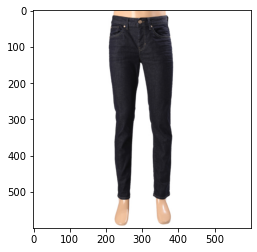

이름: [립합] 홀드하이스키니[연청추가]/자체제작/미스범범/데님팬츠   (상품 코드: 2613276268)
가격: 41,900원   최저가: 34,780원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


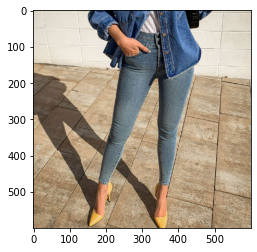

이름: [뱅뱅 캐너비] 여성 슬림핏 데님팬츠 인디고   (상품 코드: 2740576203)
가격: 11,400원   최저가: 10,230원
배송비: 무료


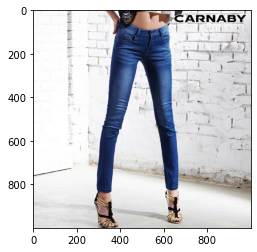

In [11]:
imageSearch("D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\input10.jpg")

INFO:tensorflow:Restoring parameters from D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\inception-v3\model.ckpt-157585
<<검색 이미지>>


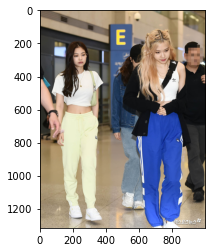

<<검색 결과 상품>>
이름: 3만원인하)푸마골프 여성 여름팬츠3종 기능성 9부 트리코트 슬랙스   (상품 코드: 2780507735)
가격: 129,000원   최저가: 129,000원
배송비: 무료


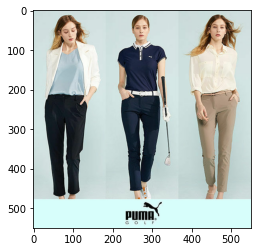

이름: [H스타일](SJ)노멀조거팬츠.   (상품 코드: 2734770063)
가격: 27,900원   최저가: 25,450원
배송비: 무료


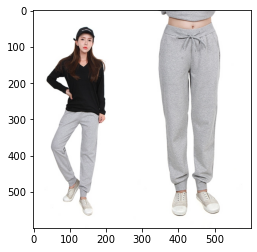

이름: [H스타일](SJ)삥줄조거배기.   (상품 코드: 2734770212)
가격: 27,900원   최저가: 25,450원
배송비: 무료


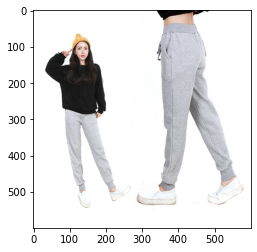

이름: [EVATAILOR] 에바테일러 20SS 수트 셋업 2종 with 채정안 (싱글버튼자켓 + 슬랙스 / 여성정장 / 여성수트)   (상품 코드: 2764340281)
가격: 49,000원   최저가: 49,000원
배송비: 무료


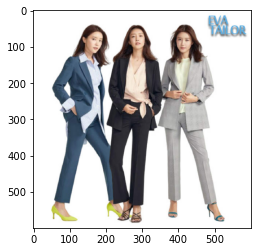

이름: [마누쉬] 슬라우치FIT 데님팬츠 2종   (상품 코드: 2730219565)
가격: 59,900원   최저가: 58,900원
배송비: 무료


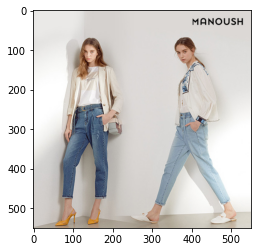

이름: [H스타일](SJ)배색지퍼배기팬츠.   (상품 코드: 2734770114)
가격: 29,900원   최저가: 27,280원
배송비: 무료


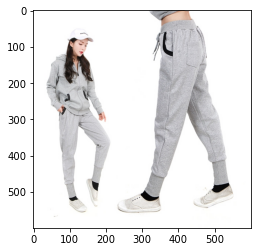

이름: [잠뱅이][jambangee] 남성 쿨맥스 캣엠보 시와 워싱 배기핏 7부 롤업 데님 AJ2DL733-DB   (상품 코드: 2443186326)
가격: 25,900원   최저가: 23,880원
배송비: 무료


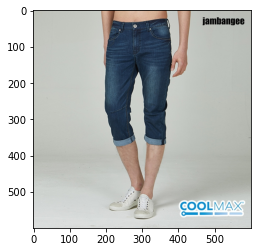

이름: [H스타일](PR)PP해골7부.   (상품 코드: 2791867515)
가격: 15,900원   최저가: 14,820원
배송비: 무료


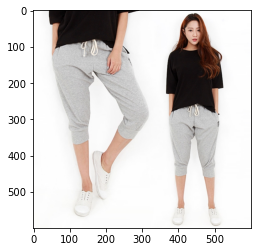

이름: [르샵] 슬릿 부츠컷 데님팬츠 LK4DP202A   (상품 코드: 2844137059)
가격: 59,000원   최저가: 43,070원
배송비: 3,000원@30,000원 미만 구매/무료@30,000원 이상 구매


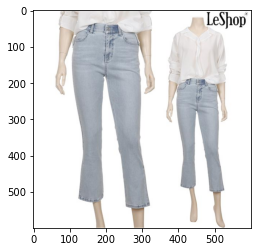

이름: 에잇세컨즈  스카이 블루 밑단 변형 부츠컷 데님 팬츠 320521FP1Q   (상품 코드: 2865015162)
가격: 39,900원   최저가: 38,310원
배송비: 39,900원 미만 구매 2,500원 / 39,900원 이상 구매 무료


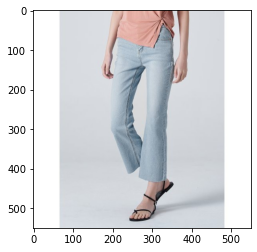

이름: 엄마옷 데드라 PTZ3907 가심비팬츠여름5탄(밑단트임)   (상품 코드: 2847821467)
가격: 16,000원   최저가: 12,660원
배송비: 50,000원 미만 구매 2,500원 / 50,000원 이상 구매 무료


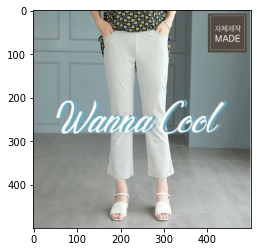

이름: [씨투] C2 여성 하이쿨링 데님 3종   (상품 코드: 2563494507)
가격: 59,000원   최저가: 53,690원
배송비: 무료


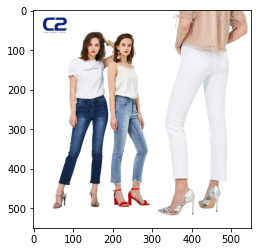

이름: [르오트]3SET [홈쇼핑방송화숙리 Hwa Sook Lee] 디자이너의 명작 진주 매직팬츠 3종세트-사이즈 5599다양   (상품 코드: 2855581854)
가격: 21,800원   최저가: 19,470원
배송비: 10,000원 미만 구매 2,500원 / 10,000원 이상 구매 무료


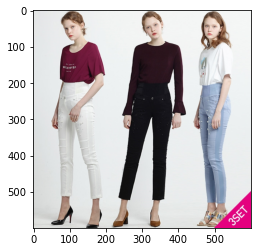

이름: [뱅뱅] 여성 라인 스판데님 검정   (상품 코드: 2360469588)
가격: 14,300원   최저가: 12,840원
배송비: 무료


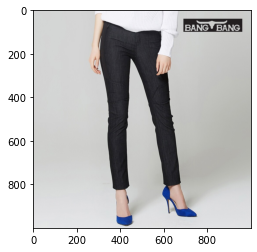

이름: [로엠](택가격:49,900) 린넨 라이크 슬랙스 (4colors)_RMTWA2501A   (상품 코드: 2882810604)
가격: 49,900원   최저가: 49,900원
배송비: 2,500원@30,000원 미만 구매/무료@30,000원 이상 구매


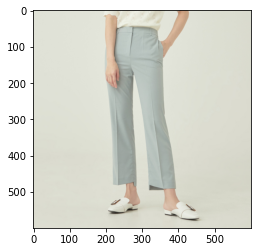

이름: [H스타일](SJ)긴시보리배기팬츠.   (상품 코드: 2734770133)
가격: 22,900원   최저가: 20,890원
배송비: 무료


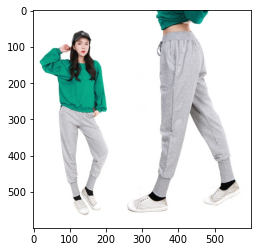

이름: [인하NO!최종가39,000원] s.a.d.e 샤데이 라이크라 세미배기핏 팬츠 3종   (상품 코드: 2771290717)
가격: 39,000원   최저가: 33,760원
배송비: 무료


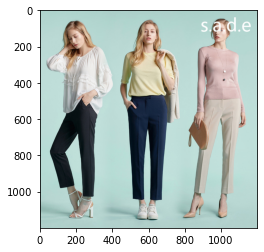

이름: [리베레츠] 남성썸머쿨TR슬랙스3종세트   (상품 코드: 2846822275)
가격: 17,910원   최저가: 17,020원
배송비: 무료


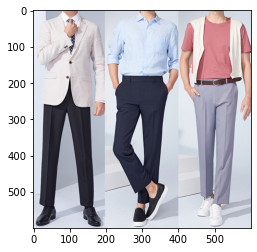

이름: (런칭가69,900원)코펜하겐럭스 린넨 블렌드 스트링팬츠3종   (상품 코드: 2788402727)
가격: 59,900원   최저가: 59,900원
배송비: 무료


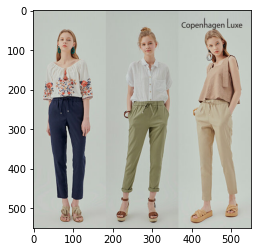

이름: [한정수량]아디다스 골프 여성 모션 쿨팬츠 스트레치 여름팬츠 3종   (상품 코드: 2374886540)
가격: 113,900원   최저가: 113,900원
배송비: 무료


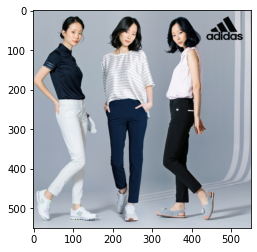

In [12]:
imageSearch("D:\Haeri_Data\Programming\JupyterNotebook\ImageSearch\input11.jpg")